# Traitement et analyses de la base de donnée du fichier dons_live_total.csv

Ici nous allons faire le traitement puis quelques analyses statistiques de la base de données créées grâce aux corpus de 32000 vidéos fournies par WIZDEO.

In [1]:
import pandas as pd
import random
import numpy as np
import time
from datetime import datetime
import seaborn as sns

On importe le fichier, on affiche sa dimension et les 5 premières lignes de celui-ci.

In [2]:
data = pd.read_csv("CSV_dons_live/dons_live_total.csv")

In [3]:
print("Notre base de données comporte ", data.shape[0], " vidéos dont est répertorié", data.shape[1], " variables qui leur correspond")

Notre base de données comporte  23761  vidéos dont est répertorié 13  variables qui leur correspond


In [4]:
data.head()

,nom_chaine,video_ID,video_titre,date_publi,delta_jour,duree_live,total_don,nbr_don,mean_don,mean_don_heure,nbr_view,nbr_like,nbr_com_live
0,Université de Technologie de Troyes,-7XQ0pRMomA,Live QX01 : Chapter 10 : On the Schrodinger Eq...,2021-05-18,319,3473.0,0.0,0,0.0,0.0,255,6.0,0
1,Université de Technologie de Troyes,xs31lYQ2iLU,Live course QX01 : Chapter 9 partie 1 : Deutsc...,2021-05-11,326,3310.0,0.0,0,0.0,0.0,230,4.0,0
2,Université de Technologie de Troyes,yEb2_UY-3ow,Live course QX01 : Chapter 8 : Quantum Algorit...,2021-05-04,333,6914.0,0.0,0,0.0,0.0,356,5.0,0
3,Université de Technologie de Troyes,Podq2qNjxMM,Live course QX01 : Chapter 6 : Quantum Gates,2021-04-06,361,6994.0,0.0,0,0.0,0.0,323,7.0,0
4,Université de Technologie de Troyes,6GO3IL4W-SE,"UTT :: Tout savoir sur la ""la soutenabilité et...",2021-04-03,364,2846.0,0.0,0,0.0,0.0,197,7.0,0


Nous avons donc une base de données avec 23761 vidéos et 13 variables qui leurs sont associées.

## 1- Traitement des données

Nous ne pouvons pas toutes les garder car certaines ne sont pas des vraies replay de chat mais seulement des vidéos mise en avant première sur Youtube. Il faut donc faire un premier tri. On estime qu'un live dure plus de 30 minutes. On va donc supprimer toutes les lignes dont la durée est inférieur à 1800 secondes.

In [5]:
indexNames = data[ data['duree_live'] <= 1800 ].index

In [6]:
len(indexNames)

1993

In [7]:
data2 = data.drop(indexNames)

In [8]:
print("Notre nouvelle base de données comporte ", data2.shape[0], " vidéos.")

Notre nouvelle base de données comporte  21768  vidéos.


Nous avons supprimé les 1993 vidéos dont la durée était inférieur ou égale à 30 minutes.

On remet en format datatime la colonne date_publi

In [9]:
data2['date_publi'] = pd.to_datetime(data2['date_publi'])

On enregistre notre nouvelle base de données.

In [10]:
data2.to_csv("CSV_dons_live/dons_live_total_II.csv", index = False)

___

## 2- Graphiques

In [12]:
data2.groupby(['nom_chaine'])

In [11]:
import plotly.express as px
# Here we use a column with categorical data
fig = px.histogram(data2, x="nom_chaine")
fig.show()

In [12]:
data_dons = data2[data2["total_don"] != 0]

In [13]:
data2[data2["total_don"] > 10]

,nom_chaine,video_ID,video_titre,date_publi,delta_jour,duree_live,total_don,nbr_don,mean_don,mean_don_heure,nbr_view,nbr_like,nbr_com_live
18,Call of Duty: Quartier Général,X2PACIRWthU,[LIVE 🔴] CALL OF DUTY: VANGUARD - MULTIJOUEURS...,2021-09-07,207,2735.0,59.97,3,19.99,78.94,12559,458.0,19
31,Frigiel,_bCiBFpK-5E,Hyrule Warriors : L'ère du Fléau #02 | LA NOUV...,2020-11-21,497,5699.0,10.78,3,3.59,6.81,55923,1684.0,55
75,NeoGeofanatic,MzCsJi6c9_A,JAY VS NEO - LE DÉBAT EN LIVE - Les différente...,2021-01-29,428,7068.0,18.00,3,6.00,9.17,5072,199.0,21
80,NeoGeofanatic,OZOrydwPQJ4,Cours en direct - La rythmique de Four Horseme...,2020-11-30,488,5383.0,20.00,1,20.00,13.38,5559,332.0,11
85,NeoGeofanatic,errnRhVz6hw,Leçon de guitare : S.O.S. d'un terrien en détr...,2020-10-26,523,3666.0,65.39,9,7.27,64.21,9234,365.0,31
...,...,...,...,...,...,...,...,...,...,...,...,...,...
23661,Au coeur de l'étrange Christine René,fYwqzl-zgbE,VENDREDI LIVE PARANORMAL DU 04 (enquetes paran...,2020-11-21,504,5983.0,23.00,4,5.75,13.84,1019,95.0,23
23690,Nakryum,UXxGogknJg0,APPLE EVENT: Mac ARM! (LE DEBRIEF),2020-11-10,515,5161.0,32.00,3,10.67,22.32,2941,93.0,2
23691,Nakryum,JHh5XQo9BaI,"iPhone 12, Homepod mini, Magsafe RETOUR SUR LA...",2020-10-13,543,6646.0,42.05,10,4.21,22.78,15840,445.0,26
23709,Yannosh51,-pVUbn50qzo,Petit live inutile du vendredi : a 1H on plie ...,2021-07-03,280,4750.0,25.00,3,8.33,18.95,499,32.0,9


In [14]:
data2[data2["total_don"] == 0].shape[0]

13622

In [15]:
names = ['Nombre de vidéos live ayant eu aucun don', 'Nombre de vidéos live ayant eu des dons'] 
fig = px.pie(values=[data2[data2["total_don"] == 0].shape[0],data2[data2["total_don"] != 0].shape[0]] , names=names) 
fig.show()

In [16]:
data_dons.groupby(['nom_chaine'])['total_don'].agg(['count', 'sum'])

,count,sum
nom_chaine,,
- NS -,1,3.49
12 Parsecs,1,58.98
ADAM LE RIGOLOW,8,496.27
ASMR KALI,1,140.00
ASMR MAM’S,1,3.99
...,...,...
jolate,1,2.00
overspes,45,2761.45
royleviking,8,19.70


In [17]:
fig = px.histogram(data_dons, x="nom_chaine", y = 'total_don')
fig.show()

In [18]:
import seaborn as sns

In [34]:
data_dons[['duree_live', 'total_don', 'nbr_don', 'mean_don','mean_don_heure','nbr_com_live']]

,duree_live,total_don,nbr_don,mean_don,mean_don_heure,nbr_com_live
18,2735.0,59.97,3,19.99,78.94,19
19,3029.0,1.99,1,1.99,2.37,24
21,4985.0,6.00,2,3.00,4.33,43
26,8606.0,1.42,1,1.42,0.59,139
30,7754.0,5.00,1,5.00,2.32,48
...,...,...,...,...,...,...
23729,9876.0,5.49,1,5.49,2.00,14
23730,13095.0,5.00,1,5.00,1.37,4
23731,3576.0,10.00,1,10.00,10.07,4
23732,13425.0,2.71,2,1.35,0.73,61


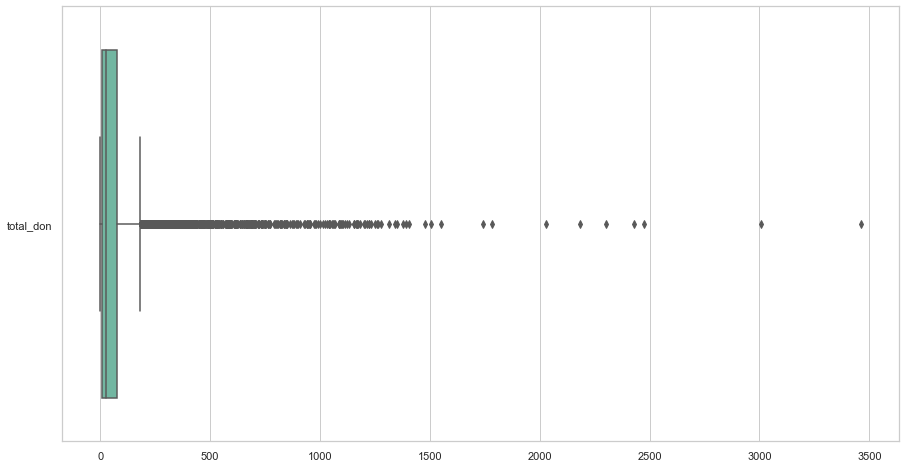

In [46]:
sns.set(style='whitegrid', rc = {'figure.figsize':(15,8)})
ax = sns.boxplot(data=data_dons[['total_don']] , orient="h", palette="Set2")

In [58]:
fig = px.box(data_dons, x="total_don")
fig.show()

In [69]:
fig = px.box(data_dons.groupby(['nom_chaine'])['total_don'].agg(['count', 'sum']), x="sum")
fig.show()

In [62]:
data3 =  pd.read_csv("CSV_dons_live/dons_live8810.csv")

In [63]:
fig = px.histogram(data3, x="nom_chaine")
fig.show()

In [71]:
data3['date_publi'] = pd.to_datetime(data3['date_publi'])

In [72]:
data_dons3 = data3[data3["total_don"] != 0]

In [73]:
print("On passe d'un ensemble de", data3.shape[0], "vidéos à un ensemble de", data_dons3.shape[0], "vidéos." )

On passe d'un ensemble de 8810 vidéos à un ensemble de 3322 vidéos.


In [89]:
data_dons3['date_publi'].dt.year

1       2020
2       2019
3       2018
4       2019
5       2018
        ... 
8629    2020
8630    2019
8631    2020
8632    2020
8709    2018
Name: date_publi, Length: 3322, dtype: int64

In [91]:
data_tot = pd.concat([data_dons,data_dons3])
data_tot['Year'] = data_tot['date_publi'].dt.year

In [94]:
fig = px.box(data_tot , y="total_don", x= 'Year')
fig.show()

In [135]:
fig = px.box(data_tot , y="nbr_don", x= 'Year')
fig.show()

In [95]:
fig = px.box(data_tot , y="mean_don_heure", x= 'Year')
fig.show()

In [117]:
year_data = pd.concat([data_tot.groupby(['Year']).mean(),data_tot.groupby(['Year']).count()['nom_chaine']], axis =1)

In [120]:
year_data = year_data.rename(columns = {'nom_chaine': 'nbr_videos'})
year_data

,delta_jour,duree_live,total_don,nbr_don,mean_don,mean_don_heure,nbr_view,nbr_like,nbr_com_live,nbr_videos
Year,,,,,,,,,,
2018,1334.271642,9376.491045,86.426263,15.246269,5.099851,37.921390,109885.504478,4492.240658,167.486567,670
2019,1029.066667,10088.518841,68.221655,13.015942,6.948433,29.808128,107120.531884,4174.791304,165.218841,690
2020,541.546756,8723.386032,169.475971,21.806546,6.907006,47.597918,71721.215663,3749.421797,90.226184,3422
2021,330.559218,9434.384260,75.139635,9.484984,8.098953,36.401067,51810.354536,2718.822430,78.887417,6493
2022,57.953368,10757.238342,99.141579,13.373057,8.232684,34.550211,90828.321244,3900.678756,124.119171,193


In [133]:
fig = px.histogram(data_tot, y="total_don", x = 'nbr_don', color="Year", marginal="box",
                   hover_data=data_tot.columns)
fig.show()

Courbe de distribution des revenus des dons
indicateur dispersion  (box plot)

prendre les 10/50 première chaînes
faire des ratio

In [ ]:
import plotly.figure_factory as ff

